# LEAD SCORE ANALYSIS

## Case Study - Summary

#### 1. Company:
- X Education (sells online courses to professionals).

#### 2. Current Situation:
- Many leads generated daily (via website visits, ads, social media, referrals).
- Only ~30% of leads convert to paying customers.
- Sales team spends excessive time contacting all leads, regardless of conversion likelihood.

#### 3. Business Goal:
- Identify “Hot Leads” (those most likely to convert).
- Build a logistic regression model to assign each lead a score between 0–100.
- Higher score → higher probability of conversion.
- CEO aims to raise conversion rate to ~80% by focusing sales efforts on high-scoring leads.

#### 4. Data Given:
- ~9000 historical lead records.
- Features include Lead Source, Total Time Spent on Website, Total Visits, Last Activity, etc.
- Target variable: `Converted` (1 = converted, 0 = not converted).
- Categorical variables contain a “Select” level → treat as missing/null.

#### 5. Expected Results:
- A Jupyter notebook with:
  - Logistic regression model.
  - Lead score predictions.
  - Model evaluation metrics (accuracy, precision, recall, ROC-AUC).
- Business insights:
  - (a) Top 3 most influential variables overall.
  - (b) Top 3 categorical/dummy variables impacting conversion.
  - (c) Strategy when interns join → aggressive outreach to medium-score leads.
  - (d) Strategy when target is met → reduce outreach to low-score leads to save resources.


In [1]:
# Import necessary libraries 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn import metrics
from sklearn.metrics import precision_recall_curve

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

## Step-1: Reading the Data

In [2]:
# Load and Read the dataset
df = pd.read_csv("Leads.csv")
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [3]:
# check the shape
df.shape

(9240, 37)

In [4]:
df_copy = df.copy()

## Step-2: Understanding Data

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [6]:
df.describe()


,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


## Step-3: Data Preparation

#### 1. Null Value Handling


In [7]:

# Remove duplicates

df.drop_duplicates(inplace=True) # inplace = True to make the changes permanent

In [8]:
# Check for the null values using isnull() function

df.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [9]:
# converting null values into percentages for better understanding
round((df.isnull().sum()/len(df)*100),2)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   15.56
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [10]:
# Handle 'SELECT' or placeholder values ( treat them as NaN)

df.replace('Select',np.nan, inplace=True)

In [11]:
# Drop columns with too many missing values [missing values >40%]

missing_ratio = df.isnull().mean()
cols_to_drop = missing_ratio[missing_ratio > 0.4].index
df.drop(columns = cols_to_drop,inplace=True)

In [12]:
df.shape

(9240, 30)

In [13]:
# Handling null values for categorical columns (replacing with mode )
for col in df.select_dtypes(include='object').columns :
    df[col].fillna(df[col].mode()[0],inplace = True)

In [14]:
# Handling null values for numerical columns ( replacing with the median )

for col in df.select_dtypes(include =['int64','float64']).columns:
    df[col].fillna(df[col].median(),inplace = True)

In [15]:
df.isnull().sum()

Prospect ID                                      0
Lead Number                                      0
Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Do Not Call                                      0
Converted                                        0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Last Activity                                    0
Country                                          0
Specialization                                   0
What is your current occupation                  0
What matters most to you in choosing a course    0
Search                                           0
Magazine                                         0
Newspaper Article                                0
X Education Forums                               0
Newspaper                      

##### Hence the null values in the data are removed. Therefore there are no null values in the data

#### 2. Outliers Handling

In [16]:
# check the outliers present in the data set by check the quantilies [.25, .5, .75, .90, .95, .99]
df.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000
mean,617188.435606,0.385390,3.438636,487.698268,2.357440
std,23405.995698,0.486714,4.819024,548.021466,2.145781
min,579533.000000,0.000000,0.000000,0.000000,0.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000
90%,650506.100000,1.000000,7.000000,1380.000000,5.000000
95%,655404.050000,1.000000,10.000000,1562.000000,6.000000
99%,659592.980000,1.000000,17.000000,1840.610000,9.000000


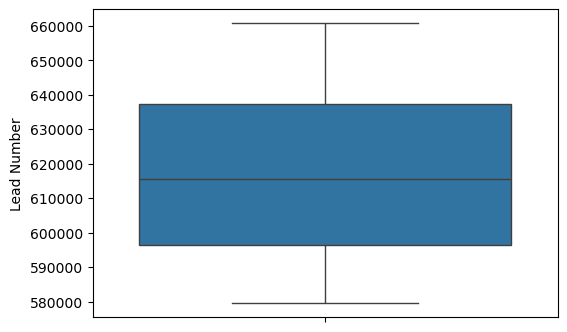

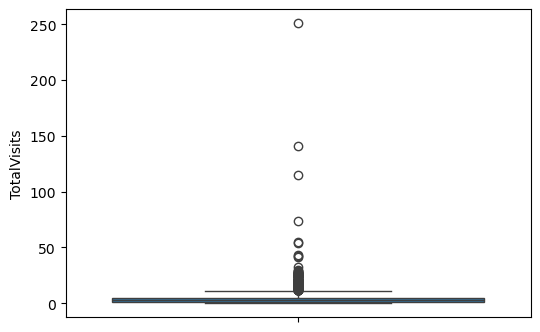

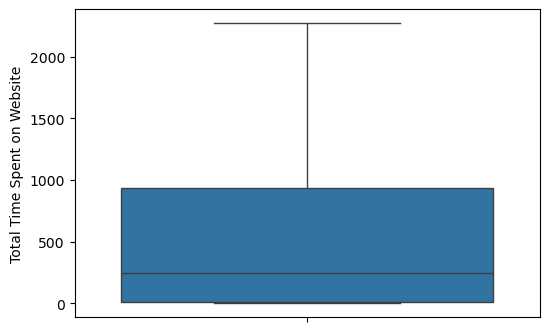

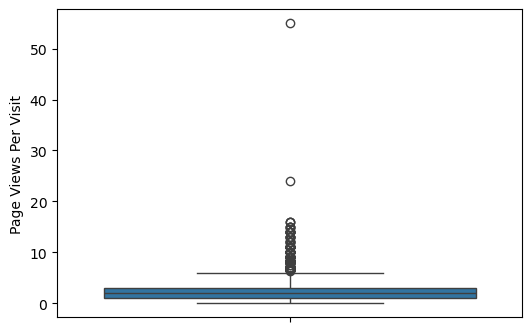

In [17]:
# Visualize the outliers in the numerical columns
num_col = df.select_dtypes(include=['int64','float64']).columns
for i in num_col:
    if i != 'Converted':
        plt.figure(figsize = (6,4))
        sns.boxplot(df[i])
        plt.show()
    
#sns.boxplot(df['Lead Number'])

In [18]:
# Checking for outliers and Handling them using Inter Quartile Range

num_col = df.select_dtypes(include=['int64','float64']).columns

for i in num_col:
    Q1 = df[i].quantile(0.25)
    Q3 = df[i].quantile(0.75)
    IQR = Q3-Q1
    lower_bound = Q1-1.5*IQR
    upper_bound = Q3+1.5*IQR
    df[i] = np.where(df[i] > upper_bound, upper_bound,
                      np.where(df[i] < lower_bound, lower_bound, df[i])) # Capping the outliers


In [19]:
df.shape

(9240, 30)

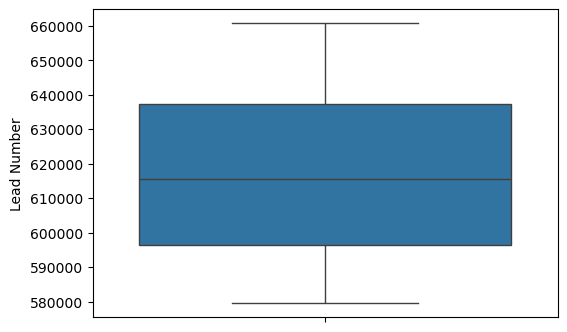

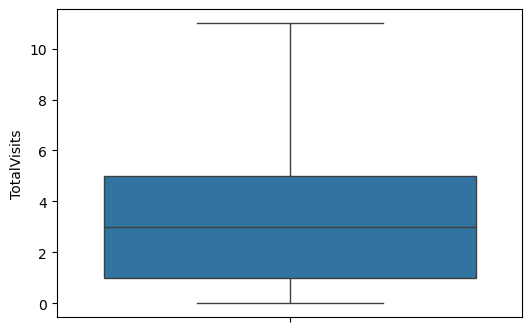

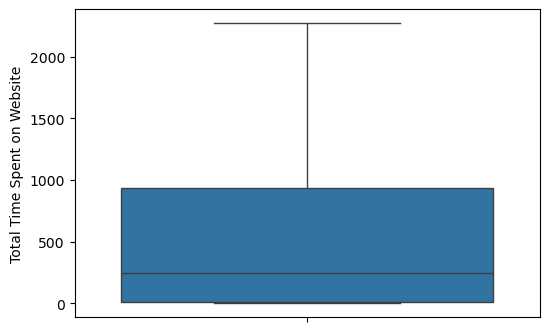

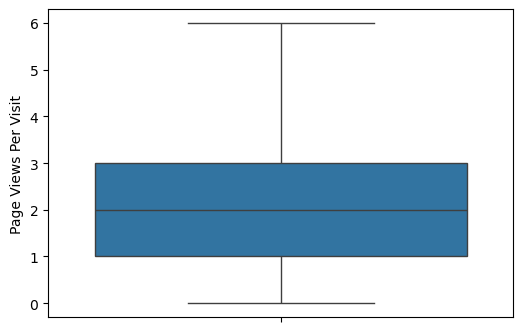

Outliers of the numerical columns are handled


In [20]:
# Visualize the outliers in the numerical columns after handling them
num_col = df.select_dtypes(include=['int64','float64']).columns
for i in num_col:
    if i != 'Converted':
        plt.figure(figsize = (6,4))
        sns.boxplot(df[i])
        plt.show()
    
print("Outliers of the numerical columns are handled")

#### 3. Identify numerical and categorical columns in the dataset

In [21]:
numerical_col = df.select_dtypes(include = ['int64','float64']).columns
categorical_col = df.select_dtypes(include = ['object']).columns
numerical_col

Index(['Lead Number', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit'],
      dtype='object')

In [22]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737.0,API,Olark Chat,No,No,0.0,0.0,0.0,0.0,...,No,No,No,Interested in other courses,No,No,Mumbai,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728.0,API,Organic Search,No,No,0.0,5.0,674.0,2.5,...,No,No,No,Ringing,No,No,Mumbai,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727.0,Landing Page Submission,Direct Traffic,No,No,1.0,2.0,1532.0,2.0,...,No,No,No,Will revert after reading the email,No,No,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719.0,Landing Page Submission,Direct Traffic,No,No,0.0,1.0,305.0,1.0,...,No,No,No,Ringing,No,No,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681.0,Landing Page Submission,Google,No,No,1.0,2.0,1428.0,1.0,...,No,No,No,Will revert after reading the email,No,No,Mumbai,No,No,Modified


### Converting some binary variables (Yes/No) to 0/1

In [23]:
variable_list = ['Do Not Email', 'Do Not Call', 'Search', 'Magazine', 'Newspaper Article', 
               'X Education Forums', 'Newspaper', 'Digital Advertisement', 
               'Through Recommendations', 'Receive More Updates About Our Courses',
               'I agree to pay the amount through cheque', 'A free copy of Mastering The Interview','Update me on Supply Chain Content','Get updates on DM Content']

In [24]:
#df[variable_list] = df[variable_list].apply(lambda x: x.map({'Yes': 1,'No': 0}))
# creating a function binary_map to convert yes/no columns to 0/1

def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the housing list
df[variable_list] = df[variable_list].apply(binary_map)

In [25]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737.0,API,Olark Chat,0,0,0.0,0.0,0.0,0.0,...,0,0,0,Interested in other courses,0,0,Mumbai,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728.0,API,Organic Search,0,0,0.0,5.0,674.0,2.5,...,0,0,0,Ringing,0,0,Mumbai,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727.0,Landing Page Submission,Direct Traffic,0,0,1.0,2.0,1532.0,2.0,...,0,0,0,Will revert after reading the email,0,0,Mumbai,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719.0,Landing Page Submission,Direct Traffic,0,0,0.0,1.0,305.0,1.0,...,0,0,0,Ringing,0,0,Mumbai,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681.0,Landing Page Submission,Google,0,0,1.0,2.0,1428.0,1.0,...,0,0,0,Will revert after reading the email,0,0,Mumbai,0,0,Modified


In [26]:
# Remove the column 'Prospect ID' it is of no use to us
df.drop('Prospect ID',axis =1, inplace = True)

### For categorical variables with multiple levels, create dummy features (one-hot encoded)

In [27]:
categorical_cols = df.select_dtypes(include='object').columns.tolist()

In [28]:
categorical_cols

['Lead Origin',
 'Lead Source',
 'Last Activity',
 'Country',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Tags',
 'City',
 'Last Notable Activity']

In [29]:
# create dummy variables for the categorical columns
dummy_variables = pd.get_dummies(df[categorical_cols], drop_first= True).astype(int)


In [30]:
# Merge the dummy variables with the original dataset
df = pd.concat([df,dummy_variables],axis=1)
df.shape

(9240, 175)

In [31]:
# Drop the categorical_cols from the data as we have created dummy variables for them
df.drop(categorical_cols, axis =1,inplace = True)

In [32]:
df.shape

(9240, 165)

In [33]:
df.head()


,Lead Number,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,660737.0,0,0,0.0,0.0,0.0,0.0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,660728.0,0,0,0.0,5.0,674.0,2.5,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,660727.0,0,0,1.0,2.0,1532.0,2.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,660719.0,0,0,0.0,1.0,305.0,1.0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,660681.0,0,0,1.0,2.0,1428.0,1.0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


#### Checking the conversion rate


In [34]:
lead_conversion_rate = (sum(df['Converted'])/len(df['Converted'].index))*100
lead_conversion_rate

38.53896103896104

### Step-4 : Looking at correlations

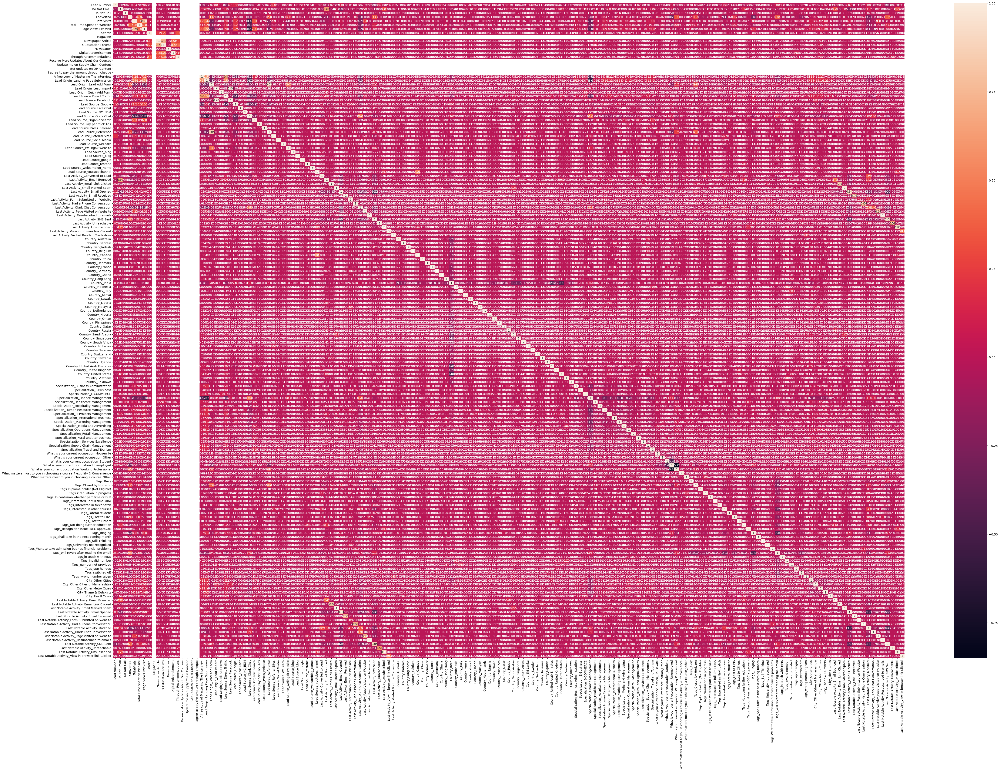

In [46]:
# Correlation matrix using heatmap
plt.figure(figsize=(60,40))
sns.heatmap(df.corr(),annot = True)
plt.show()

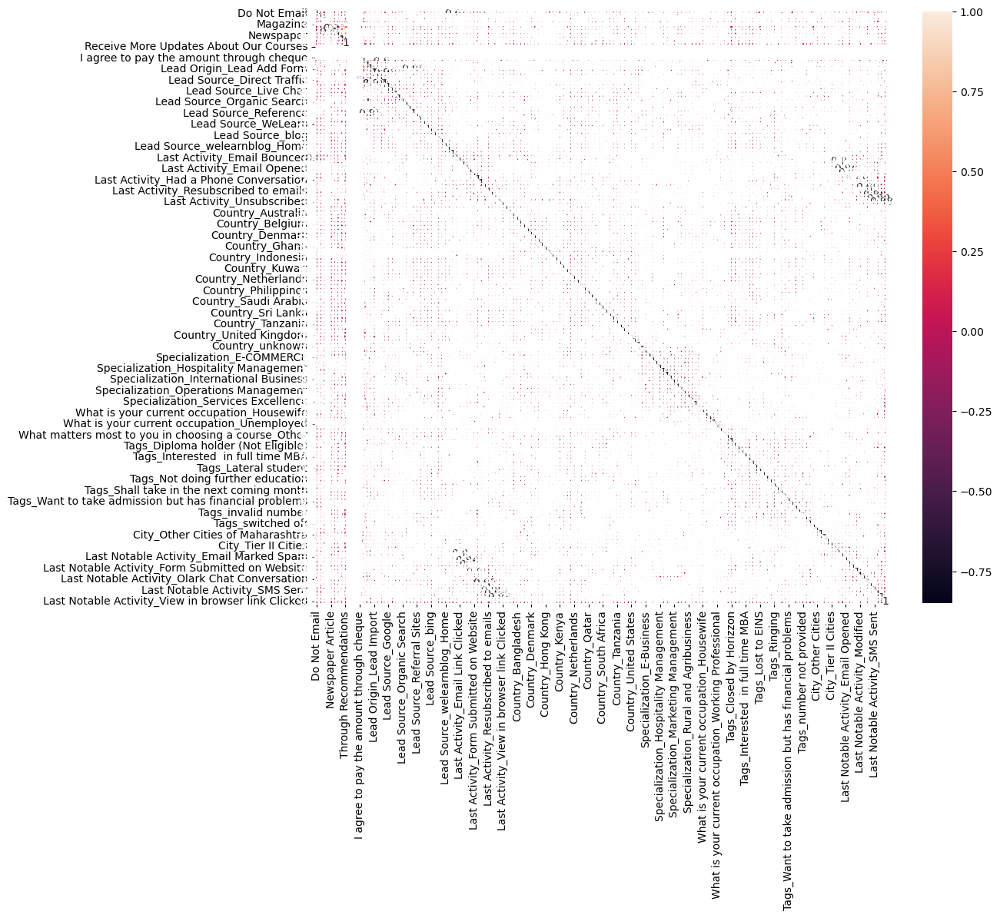

In [47]:
# Heatmap for numerical columns
plt.figure(figsize = (12,10))
sns.heatmap(df.select_dtypes(include=['int64','int32']).corr(), annot = True)
plt.show()

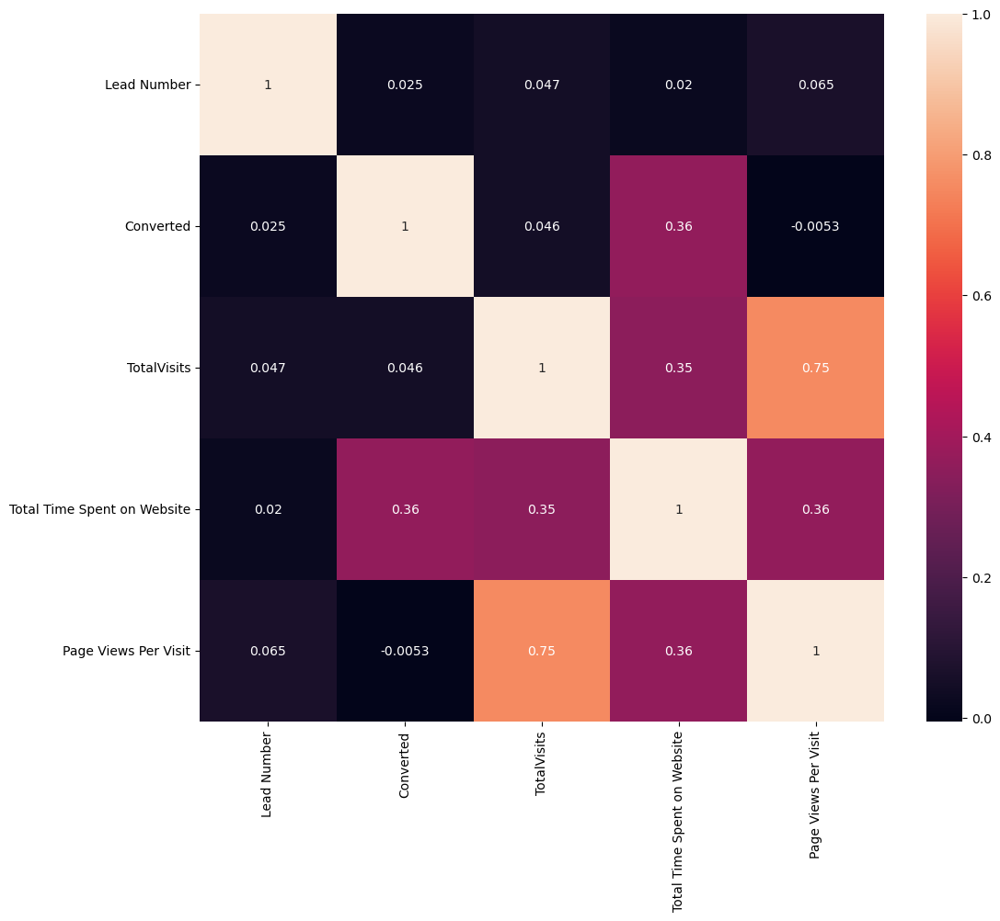

In [48]:
# heatmap for only float value columns
plt.figure(figsize = (12,10))
sns.heatmap(df.select_dtypes(include=['float']).corr(), annot = True)
plt.show()

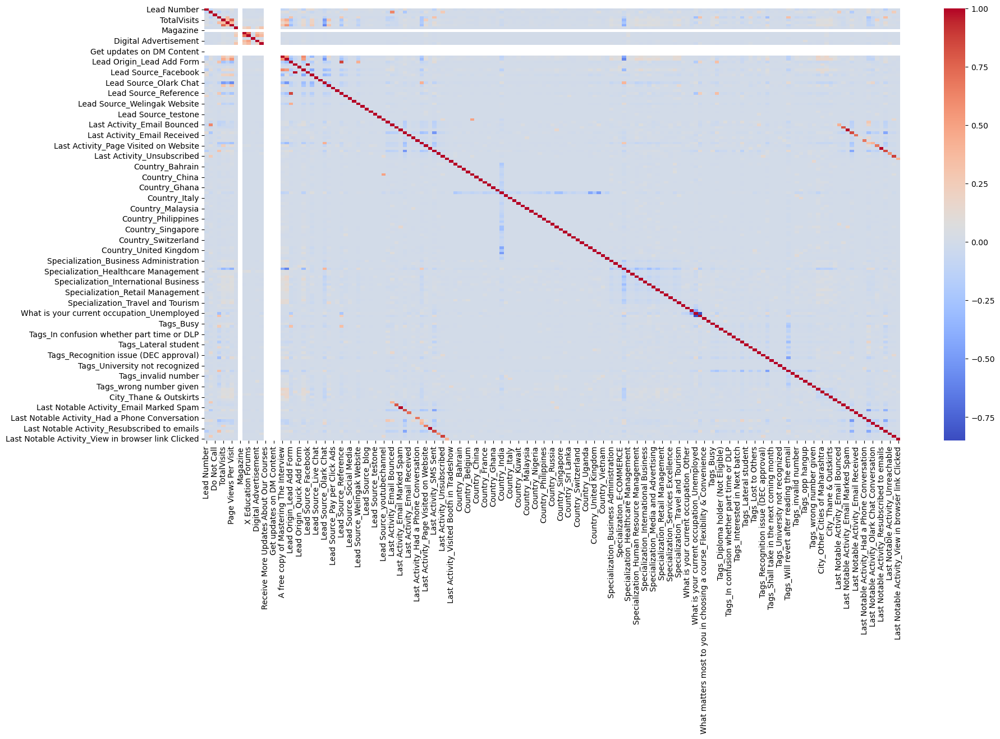

In [35]:
# Create correlation matrix for dummy_variables
leads_encoded = pd.get_dummies(df, drop_first=True)

plt.figure(figsize=(20,10))
sns.heatmap(leads_encoded.corr(), annot=False, cmap="coolwarm")  # annot=False for clarity
plt.show()

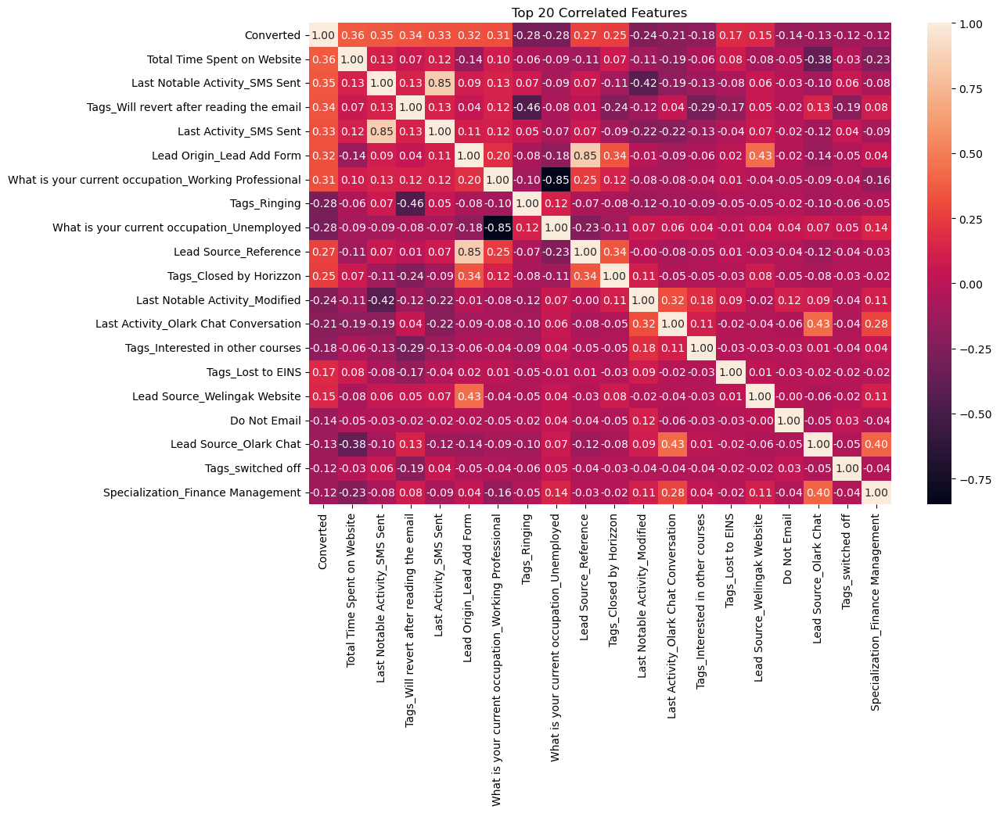

In [36]:
# correlation matrix using top features
corr_matrix = leads_encoded.corr()

# pick top 20 features most correlated with Converted
top_features = corr_matrix["Converted"].abs().sort_values(ascending=False).head(20).index

plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix.loc[top_features, top_features], annot=True, fmt=".2f")
plt.title("Top 20 Correlated Features")
plt.show()

In [37]:
# dropping the columns which are highly correlated
df.drop(['What is your current occupation_Unemployed', 'What is your current occupation_Working Professional'], axis=1, inplace=True)

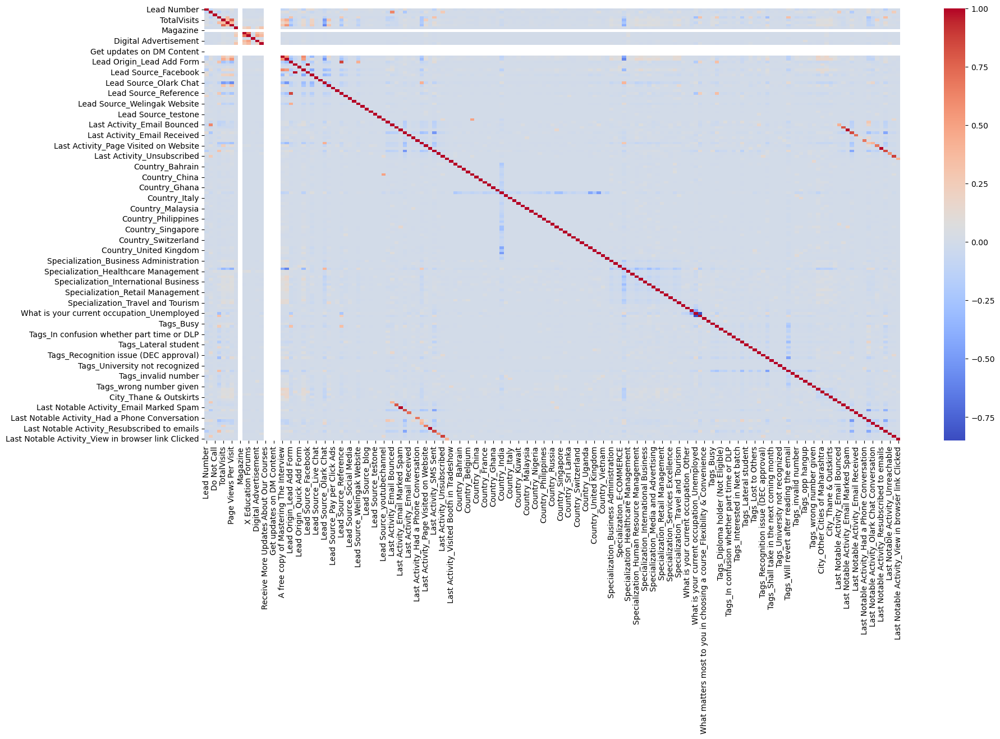

In [38]:
# Get new dummy variables after dropping the higly correlated columns
leads_encoded_new = pd.get_dummies(df, drop_first=True)

plt.figure(figsize=(20,10))
sns.heatmap(leads_encoded.corr(), annot=False, cmap="coolwarm")  # annot=False for clarity
plt.show()

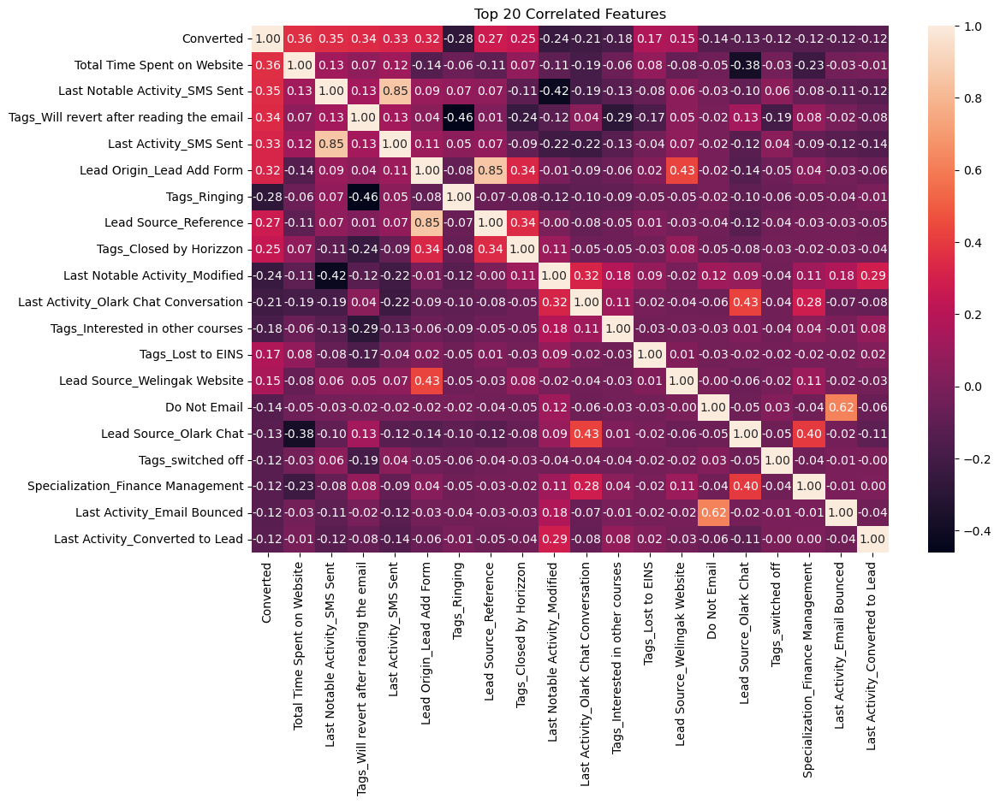

In [39]:
# correlation matrix
corr_matrix = leads_encoded_new.corr()
# pick top 20 features most correlated with Converted
top_features = corr_matrix["Converted"].abs().sort_values(ascending=False).head(20).index

plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix.loc[top_features, top_features], annot=True, fmt=".2f")
plt.title("Top 20 Correlated Features")
plt.show()

### Step-5: Split data into input and target variables

In [40]:
# splitting the data into input and target variables
x = df.drop(columns =['Converted','Lead Number'],axis=1)
y = df['Converted']
x.shape

(9240, 161)

In [41]:
# Let's start with splitting data into train and test data

x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.2,random_state= 42)


### Step-6 : Feature Scaling

In [42]:
# Feature scaling using standard scaler
scaler = StandardScaler()
x_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']]= scaler.fit_transform(x_train[['TotalVisits',
                                                                                                             'Total Time Spent on Website',
                                                                                                             'Page Views Per Visit']])

In [43]:
x_train.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
6487,1,0,-0.433198,-0.454165,-0.149720,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4759,0,0,-1.129102,-0.889097,-1.272692,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4368,0,0,-0.085246,-0.168456,0.411765,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1467,0,0,0.262706,0.737805,0.973251,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5517,0,0,-0.433198,-0.628866,-0.149720,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


#### Few Insights on the Variables affecting lead conversion

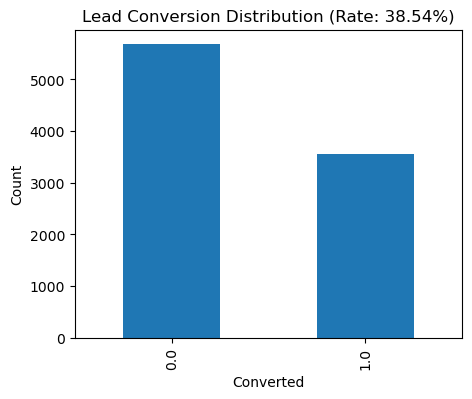

INSIGHT 1: Overall conversion rate is 38.54%, a benchmark for lead nurturing success.


In [44]:
# Insight 1: Overall Conversion Rate
import matplotlib.pyplot as plt
import seaborn as sns
conversion_rate = y.mean() * 100
plt.figure(figsize=(5, 4))
y.value_counts().plot(kind='bar')
plt.title(f'Lead Conversion Distribution (Rate: {conversion_rate:.2f}%)')
plt.xlabel('Converted')
plt.ylabel('Count')
plt.show()
print(f"INSIGHT 1: Overall conversion rate is {conversion_rate:.2f}%, a benchmark for lead nurturing success.")


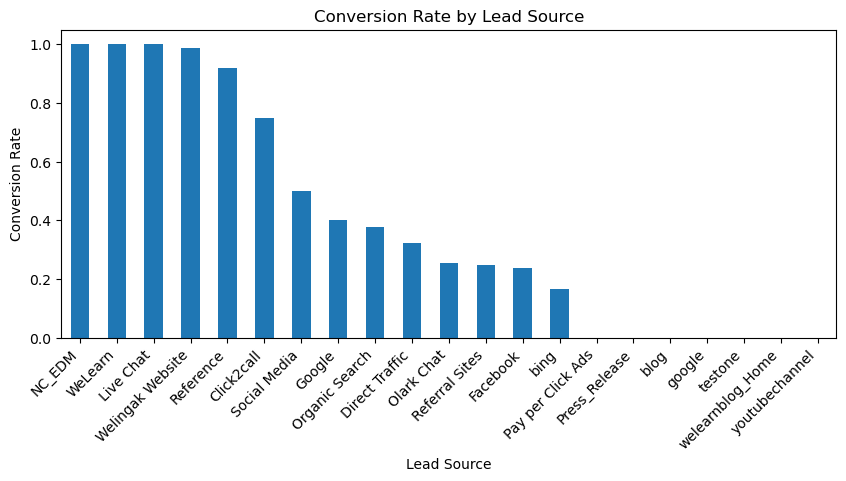

INSIGHT 2: High-converting sources should get priority in marketing budgets.


In [49]:
# Insight 2: Conversion by Lead Source
lead_source_conv = df_copy.groupby('Lead Source')['Converted'].mean().sort_values(ascending=False)
plt.figure(figsize=(10, 4))
lead_source_conv.plot(kind='bar')
plt.title('Conversion Rate by Lead Source')
plt.ylabel('Conversion Rate')
plt.xticks(rotation=45, ha='right')
plt.show()
print("INSIGHT 2: High-converting sources should get priority in marketing budgets.")


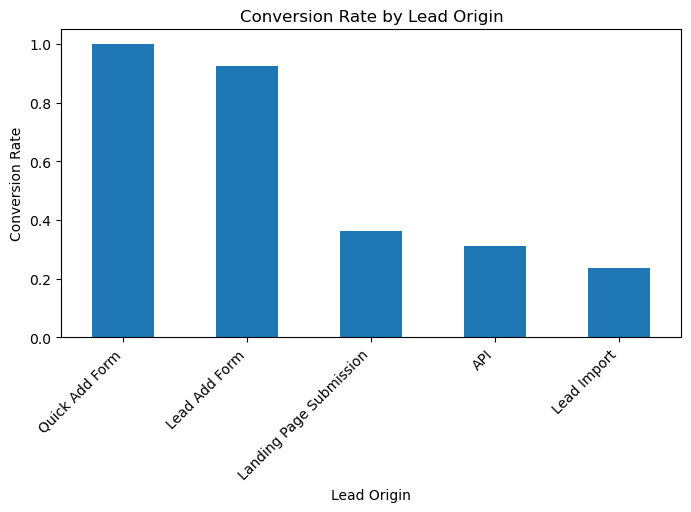

INSIGHT 3: Lead Origin is a strong segmentation variable — optimize acquisition channels accordingly.


In [51]:
# Insight 3: Conversion by Lead Origin
lead_origin_conv = df_copy.groupby('Lead Origin')['Converted'].mean().sort_values(ascending=False)
plt.figure(figsize=(8, 4))
lead_origin_conv.plot(kind='bar')
plt.title('Conversion Rate by Lead Origin')
plt.ylabel('Conversion Rate')
plt.xticks(rotation=45, ha='right')
plt.show()
print("INSIGHT 3: Lead Origin is a strong segmentation variable — optimize acquisition channels accordingly.")


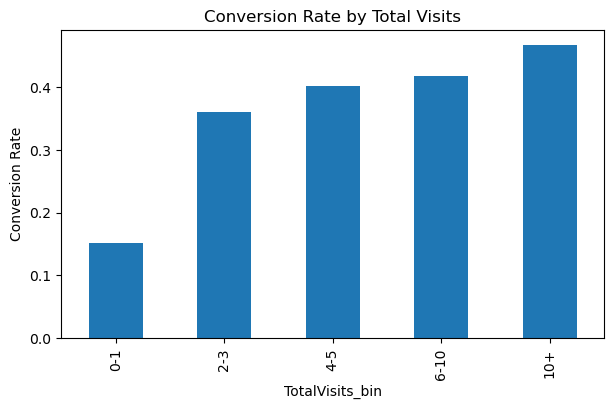

INSIGHT 4: Visitors with more site visits have higher conversion probability — retarget low-visit users.


In [52]:
# Insight 4: Total Visits vs Conversion
if 'TotalVisits' in x.columns:
    df_visits = df.copy()
    df_visits['TotalVisits_bin'] = pd.cut(df_visits['TotalVisits'], bins=[0, 1, 3, 5, 10, np.inf], labels=['0-1', '2-3', '4-5', '6-10', '10+'])
    visit_conv = df_visits.groupby('TotalVisits_bin')['Converted'].mean()
    plt.figure(figsize=(7, 4))
    visit_conv.plot(kind='bar')
    plt.title('Conversion Rate by Total Visits')
    plt.ylabel('Conversion Rate')
    plt.show()
    print("INSIGHT 4: Visitors with more site visits have higher conversion probability — retarget low-visit users.")


<Figure size 800x400 with 0 Axes>

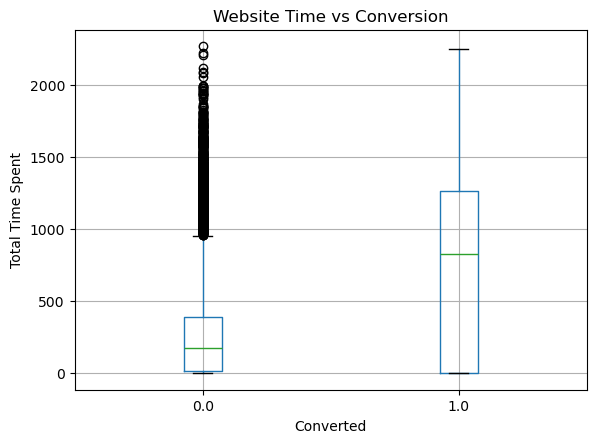

INSIGHT 5: Higher engagement time strongly correlates with conversion.


In [53]:
# Insight 5: Total Time Spent vs Conversion
if 'Total Time Spent on Website' in x.columns:
    plt.figure(figsize=(8, 4))
    df.boxplot(column='Total Time Spent on Website', by='Converted')
    plt.suptitle('')
    plt.title('Website Time vs Conversion')
    plt.ylabel('Total Time Spent')
    plt.show()
    print("INSIGHT 5: Higher engagement time strongly correlates with conversion.")


### Step -7: Model Building 

In [54]:
import statsmodels.api as sm

In [55]:
# Logistic Regression Model
logm1 = sm.GLM(y_train, (sm.add_constant(x_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7392
Model:                            GLM   Df Residuals:                     7245
Model Family:                Binomial   Df Model:                          146
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Fri, 26 Sep 2025   Deviance:                       93393.
Time:                        20:13:05   Pearson chi2:                 4.57e+18
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
===========================================================================================================================================
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                    1.304e+16    9.4e+07   1.39e+08      0.000     1.3e+16     1.3e+16
Do Not Email                                                            -4.491e+14   4.14e+06  -1.09e+08      0.000   -4.49e+14   -4.49e+14
Do Not Call                                                              7.764e+15   4.77e+07   1.63e+08      0.000    7.76e+15    7.76e+15
TotalVisits                                                              8.281e+13   1.32e+06   6.29e+07      0.000    8.28e+13    8.28e+13
Total Time Spent on Website                                              4.253e+14   9.26e+05    4.6e+08      0.000    4.25e+14    4.25e+14
Page Views Per Visit                                                    -9.822e+13   1.44e+06   -6.8e+07      0.000   -9.82e+13   -9.82e+13
Search                                                                   7.833e+14   2.11e+07   3.72e+07      0.000    7.83e+14    7.83e+14
Magazine                                                                   83.2603   8.93e-07   9.33e+07      0.000      83.260      83.260
Newspaper Article                                                        2.107e+15   6.73e+07   3.13e+07      0.000    2.11e+15    2.11e+15
X Education Forums                                                       -9.99e+15   1.08e+08  -9.27e+07      0.000   -9.99e+15   -9.99e+15
Newspaper                                                                -7.93e+15   6.73e+07  -1.18e+08      0.000   -7.93e+15   -7.93e+15
Digital Advertisement                                                    5.979e+14   3.91e+07   1.53e+07      0.000    5.98e+14    5.98e+14
Through Recommendations                                                  1.285e+15   2.84e+07   4.52e+07      0.000    1.28e+15    1.28e+15
Receive More Updates About Our Courses                                     75.4163   1.06e-06   7.14e+07      0.000      75.416      75.416
Update me on Supply Chain Content                                        -368.3959   2.09e-06  -1.76e+08      0.000    -368.396    -368.396
Get updates on DM Content                                                 172.3771   1.11e-06   1.56e+08      0.000     172.377     172.377
I agree to pay the amount through cheque                                 -124.1646    1.6e-06  -7.76e+07      0.000    -124.165    -124.165
A free copy of Mastering The Interview                                  -1.357e+14   2.52e+06  -5.38e+07      0.000   -1.36e+14   -1.36e+14
Lead Origin_Landing Page Submission                                     -1.867e+14   2.81e+06  -6.65e+07      0.000   -1.87e+14   -1.87e+14
Lea

#### Feature selection by using RFE

In [56]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=1000)

In [57]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, n_features_to_select=15)
rfe = rfe.fit(x_train,y_train)

In [58]:
rfe.support_

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
        True, False, False, False, False, False, False, False,  True,
       False, False,

In [59]:
list(zip(x_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('Do Not Call', False, 99),
 ('TotalVisits', False, 81),
 ('Total Time Spent on Website', False, 2),
 ('Page Views Per Visit', False, 80),
 ('Search', False, 110),
 ('Magazine', False, 134),
 ('Newspaper Article', False, 65),
 ('X Education Forums', False, 64),
 ('Newspaper', False, 118),
 ('Digital Advertisement', False, 79),
 ('Through Recommendations', False, 49),
 ('Receive More Updates About Our Courses', False, 144),
 ('Update me on Supply Chain Content', False, 146),
 ('Get updates on DM Content', False, 141),
 ('I agree to pay the amount through cheque', False, 136),
 ('A free copy of Mastering The Interview', False, 57),
 ('Lead Origin_Landing Page Submission', False, 9),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 26),
 ('Lead Origin_Quick Add Form', False, 73),
 ('Lead Source_Direct Traffic', False, 78),
 ('Lead Source_Facebook', False, 100),
 ('Lead Source_Google', False, 85),
 ('Lead Source_Live Chat', False, 11

In [60]:
# columns which are selected from RFE model
col = x_train.columns[rfe.support_]
col

Index(['Do Not Email', 'Lead Origin_Lead Add Form',
       'Lead Source_Welingak Website', 'Tags_Busy', 'Tags_Closed by Horizzon',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_switched off',
       'Tags_wrong number given',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed'],
      dtype='object')

#### Assessing the model with statsmodel

In [61]:
x_train_sm = sm.add_constant(x_train[col])
logm2 = sm.GLM(y_train,x_train_sm, sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7392
Model:                            GLM   Df Residuals:                     7376
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2613.0
Date:                Fri, 26 Sep 2025   Deviance:                       5225.9
Time:                        20:13:12   Pearson chi2:                 1.25e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.4635
Covariance Type:            nonrobust                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                             -3.6865      0.176    -20.980      0.000      -4.031      -3.342
Do Not Email                                      -1.5251      0.170     -8.952      0.000      -1.859      -1.191
Lead Origin_Lead Add Form                          2.4149      0.209     11.537      0.000       2.005       2.825
Lead Source_Welingak Website                       1.9829      1.034      1.917      0.055      -0.045       4.010
Tags_Busy                                          2.7654      0.273     10.141      0.000       2.231       3.300
Tags_Closed by Horizzon                            8.0383      0.734     10.959      0.000       6.601       9.476
Tags_Lost to EINS                                  7.2176      0.539     13.394      0.000       6.161       8.274
Tags_Ringing                                      -1.7335      0.281     -6.170      0.000      -2.284      -1.183
Tags_Will revert after reading the email           3.0988      0.178     17.372      0.000       2.749       3.448
Tags_invalid number                               -2.0582      1.040     -1.980      0.048      -4.096      -0.021
Tags_number not provided                         -22.0940   2.21e+04     -0.001      0.999   -4.33e+04    4.33e+04
Tags_switched off                                 -2.5735      0.741     -3.472      0.001      -4.026      -1.121
Tags_wrong number given                          -21.9906   1.73e+04     -0.001      0.999   -3.39e+04    3.38e+04
Last Notable Activity_Had a Phone Conversation     3.7106      1.169      3.175      0.001       1.420       6.001
Last Notable Activity_SMS Sent                     2.8038      0.102     27.602      0.000       2.605       3.003
Last Notable Activity_Unsubscribed                 2.1135      0.507      4.171      0.000       1.120       3.107
==================================================================================================================
"""

In [62]:
# Make predictions on the training data
y_train_pred = res.predict(x_train_sm)
y_train_pred

6487    0.015654
4759    0.357183
4368    0.024448
1467    0.901694
5517    0.024448
          ...   
5734    0.004408
5191    0.357183
5390    0.990350
860     0.004408
7270    0.357183
Length: 7392, dtype: float64

In [63]:
# Reshape values 
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.01565423, 0.35718324, 0.02444791, 0.90169386, 0.02444791,
       0.00440771, 0.35718324, 0.35718324, 0.97155985, 0.02444791])

##### Creating a dataframe with the actual converted value and the predicted probabilities

In [64]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values,'converted_prob':y_train_pred})
y_train_pred_final['Prospect ID'] = y_train.index
y_train_pred_final

,Converted,converted_prob,Prospect ID
0,0.0,0.015654,6487
1,0.0,0.357183,4759
2,0.0,0.024448,4368
3,1.0,0.901694,1467
4,0.0,0.024448,5517
...,...,...,...
7387,0.0,0.004408,5734
7388,0.0,0.357183,5191
7389,1.0,0.990350,5390
7390,0.0,0.004408,860


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [65]:
y_train_pred_final['Predicted'] = y_train_pred_final.converted_prob.map(lambda x : 1 if x>0.5 else 0)
y_train_pred_final

,Converted,converted_prob,Prospect ID,Predicted
0,0.0,0.015654,6487,0
1,0.0,0.357183,4759,0
2,0.0,0.024448,4368,0
3,1.0,0.901694,1467,1
4,0.0,0.024448,5517,0
...,...,...,...,...
7387,0.0,0.004408,5734,0
7388,0.0,0.357183,5191,0
7389,1.0,0.990350,5390,1
7390,0.0,0.004408,860,0


#### Confusion matrix

In [66]:
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.Predicted)
confusion_matrix

array([[4428,  144],
       [1060, 1760]], dtype=int64)

In [67]:
accuracy_score = metrics.accuracy_score(y_train_pred_final.Converted,y_train_pred_final.Predicted)
accuracy_score

0.8371212121212122

#### Checking VIFs

In [68]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = x_train[col].columns
vif['VIF'] = [variance_inflation_factor(x_train[col].values,i) for i in range(x_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by = 'VIF',ascending = False)
vif

,Features,VIF
1,Lead Origin_Lead Add Form,1.49
13,Last Notable Activity_SMS Sent,1.44
7,Tags_Will revert after reading the email,1.37
2,Lead Source_Welingak Website,1.22
4,Tags_Closed by Horizzon,1.16
0,Do Not Email,1.14
6,Tags_Ringing,1.09
14,Last Notable Activity_Unsubscribed,1.06
3,Tags_Busy,1.03
10,Tags_switched off,1.03


In [69]:
col = col.drop('Tags_number not provided',1)

In [70]:
x_train_sm = sm.add_constant(x_train[col])
logm3 = sm.GLM(y_train,x_train_sm, sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7392
Model:                            GLM   Df Residuals:                     7377
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2615.4
Date:                Fri, 26 Sep 2025   Deviance:                       5230.8
Time:                        20:13:17   Pearson chi2:                 1.25e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.4631
Covariance Type:            nonrobust                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                             -3.7498      0.176    -21.259      0.000      -4.095      -3.404
Do Not Email                                      -1.5271      0.170     -8.982      0.000      -1.860      -1.194
Lead Origin_Lead Add Form                          2.4195      0.210     11.537      0.000       2.008       2.831
Lead Source_Welingak Website                       1.9780      1.035      1.912      0.056      -0.050       4.006
Tags_Busy                                          2.8342      0.272     10.407      0.000       2.300       3.368
Tags_Closed by Horizzon                            8.1015      0.734     11.042      0.000       6.663       9.539
Tags_Lost to EINS                                  7.2810      0.539     13.507      0.000       6.224       8.338
Tags_Ringing                                      -1.6580      0.280     -5.919      0.000      -2.207      -1.109
Tags_Will revert after reading the email           3.1640      0.179     17.698      0.000       2.814       3.514
Tags_invalid number                               -1.9821      1.039     -1.907      0.057      -4.019       0.055
Tags_switched off                                 -2.4968      0.741     -3.371      0.001      -3.949      -1.045
Tags_wrong number given                          -21.9152   1.73e+04     -0.001      0.999   -3.39e+04    3.39e+04
Last Notable Activity_Had a Phone Conversation     3.7311      1.176      3.171      0.002       1.425       6.037
Last Notable Activity_SMS Sent                     2.7890      0.101     27.670      0.000       2.591       2.987
Last Notable Activity_Unsubscribed                 2.1155      0.507      4.172      0.000       1.122       3.109
==================================================================================================================
"""

In [71]:
y_train_pred = res.predict(x_train_sm)
y_train_pred

6487    0.015583
4759    0.357612
4368    0.022982
1467    0.900540
5517    0.022982
          ...   
5734    0.004461
5191    0.357612
5390    0.990270
860     0.004461
7270    0.357612
Length: 7392, dtype: float64

In [72]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.01558295, 0.35761196, 0.02298228, 0.90053976, 0.02298228,
       0.00446149, 0.35761196, 0.35761196, 0.97156333, 0.02298228])

In [73]:
# y_train_pred_final = pd.DataFrame({'Converted':y_train.values,'converted_prob':y_train_pred})
# y_train_pred_final['Prospect ID'] = y_train.index
# y_train_pred_final

y_train_pred_final['converted_prob'] = y_train_pred

In [74]:
y_train_pred_final['Predicted'] = y_train_pred_final.converted_prob.map(lambda x : 1 if x>0.5 else 0)
y_train_pred_final

,Converted,converted_prob,Prospect ID,Predicted
0,0.0,0.015583,6487,0
1,0.0,0.357612,4759,0
2,0.0,0.022982,4368,0
3,1.0,0.900540,1467,1
4,0.0,0.022982,5517,0
...,...,...,...,...
7387,0.0,0.004461,5734,0
7388,0.0,0.357612,5191,0
7389,1.0,0.990270,5390,1
7390,0.0,0.004461,860,0


In [75]:
from sklearn import metrics
confusion_matrix2 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.Predicted)
confusion_matrix2

array([[4428,  144],
       [1061, 1759]], dtype=int64)

In [76]:
accuracy_score = metrics.accuracy_score(y_train_pred_final.Converted,y_train_pred_final.Predicted)
accuracy_score

0.8369859307359307

In [77]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = x_train[col].columns
vif['VIF'] = [variance_inflation_factor(x_train[col].values,i) for i in range(x_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by = 'VIF',ascending = False)
vif

,Features,VIF
1,Lead Origin_Lead Add Form,1.49
12,Last Notable Activity_SMS Sent,1.44
7,Tags_Will revert after reading the email,1.37
2,Lead Source_Welingak Website,1.22
4,Tags_Closed by Horizzon,1.16
0,Do Not Email,1.13
6,Tags_Ringing,1.09
13,Last Notable Activity_Unsubscribed,1.06
3,Tags_Busy,1.03
9,Tags_switched off,1.03


In [78]:
# Let's drop the column 'Tags_wrong number given' which has high p-value
col = col.drop('Tags_wrong number given')
col

Index(['Do Not Email', 'Lead Origin_Lead Add Form',
       'Lead Source_Welingak Website', 'Tags_Busy', 'Tags_Closed by Horizzon',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed'],
      dtype='object')

In [79]:
x_train_sm = sm.add_constant(x_train[col])
logm4 = sm.GLM(y_train,x_train_sm, sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7392
Model:                            GLM   Df Residuals:                     7378
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2618.8
Date:                Fri, 26 Sep 2025   Deviance:                       5237.6
Time:                        20:13:22   Pearson chi2:                 1.25e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4626
Covariance Type:            nonrobust                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                             -3.8382      0.177    -21.672      0.000      -4.185      -3.491
Do Not Email                                      -1.5355      0.169     -9.065      0.000      -1.868      -1.204
Lead Origin_Lead Add Form                          2.4263      0.210     11.537      0.000       2.014       2.838
Lead Source_Welingak Website                       1.9712      1.035      1.905      0.057      -0.057       3.999
Tags_Busy                                          2.9297      0.272     10.779      0.000       2.397       3.462
Tags_Closed by Horizzon                            8.1899      0.734     11.160      0.000       6.752       9.628
Tags_Lost to EINS                                  7.3701      0.539     13.666      0.000       6.313       8.427
Tags_Ringing                                      -1.5545      0.279     -5.572      0.000      -2.101      -1.008
Tags_Will revert after reading the email           3.2550      0.179     18.173      0.000       2.904       3.606
Tags_invalid number                               -1.8778      1.039     -1.807      0.071      -3.914       0.158
Tags_switched off                                 -2.3915      0.740     -3.231      0.001      -3.842      -0.941
Last Notable Activity_Had a Phone Conversation     3.7602      1.188      3.165      0.002       1.432       6.089
Last Notable Activity_SMS Sent                     2.7706      0.100     27.736      0.000       2.575       2.966
Last Notable Activity_Unsubscribed                 2.1239      0.508      4.185      0.000       1.129       3.119
==================================================================================================================
"""

In [80]:
y_train_pred = res.predict(x_train_sm).values.reshape(-1)
y_train_pred[:10]

array([0.01540345, 0.35820124, 0.02107786, 0.89911781, 0.02107786,
       0.00452884, 0.35820124, 0.35820124, 0.97158096, 0.02107786])

In [81]:
y_train_pred_final['converted_prob'] = y_train_pred

In [82]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['Predicted'] = y_train_pred_final.converted_prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,converted_prob,Prospect ID,Predicted
0,0.0,0.015403,6487,0
1,0.0,0.358201,4759,0
2,0.0,0.021078,4368,0
3,1.0,0.899118,1467,1
4,0.0,0.021078,5517,0


In [83]:
confusion_matrix3 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.Predicted)
confusion_matrix3

array([[4428,  144],
       [1061, 1759]], dtype=int64)

In [84]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.8369859307359307


##### Let's now check the VIFs again

In [85]:
vif = pd.DataFrame()
vif['Features'] = x_train[col].columns
vif['VIF'] = [variance_inflation_factor(x_train[col].values,i) for i in range(x_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by = 'VIF',ascending = False)
vif

,Features,VIF
1,Lead Origin_Lead Add Form,1.49
11,Last Notable Activity_SMS Sent,1.43
7,Tags_Will revert after reading the email,1.36
2,Lead Source_Welingak Website,1.22
4,Tags_Closed by Horizzon,1.16
0,Do Not Email,1.12
6,Tags_Ringing,1.09
12,Last Notable Activity_Unsubscribed,1.06
3,Tags_Busy,1.03
9,Tags_switched off,1.03


In [86]:
# Let's drop the column 'Tags_wrong number given' which has high p-value
col = col.drop('Tags_invalid number')
col

Index(['Do Not Email', 'Lead Origin_Lead Add Form',
       'Lead Source_Welingak Website', 'Tags_Busy', 'Tags_Closed by Horizzon',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_switched off',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed'],
      dtype='object')

In [87]:
x_train_sm = sm.add_constant(x_train[col])
logm5 = sm.GLM(y_train,x_train_sm, sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7392
Model:                            GLM   Df Residuals:                     7379
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2621.6
Date:                Fri, 26 Sep 2025   Deviance:                       5243.3
Time:                        20:13:28   Pearson chi2:                 1.26e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4622
Covariance Type:            nonrobust                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                             -3.9547      0.176    -22.453      0.000      -4.300      -3.609
Do Not Email                                      -1.5310      0.169     -9.052      0.000      -1.863      -1.199
Lead Origin_Lead Add Form                          2.4335      0.211     11.533      0.000       2.020       2.847
Lead Source_Welingak Website                       1.9628      1.035      1.897      0.058      -0.065       3.991
Tags_Busy                                          3.0538      0.270     11.316      0.000       2.525       3.583
Tags_Closed by Horizzon                            8.3056      0.734     11.321      0.000       6.868       9.744
Tags_Lost to EINS                                  7.4861      0.539     13.889      0.000       6.430       8.543
Tags_Ringing                                      -1.4207      0.276     -5.144      0.000      -1.962      -0.879
Tags_Will revert after reading the email           3.3740      0.178     18.988      0.000       3.026       3.722
Tags_switched off                                 -2.2562      0.739     -3.053      0.002      -3.705      -0.808
Last Notable Activity_Had a Phone Conversation     3.7999      1.204      3.156      0.002       1.440       6.160
Last Notable Activity_SMS Sent                     2.7491      0.099     27.823      0.000       2.555       2.943
Last Notable Activity_Unsubscribed                 2.1073      0.506      4.168      0.000       1.116       3.098
==================================================================================================================
"""

In [88]:
y_train_pred = res.predict(x_train_sm).values.reshape(-1)
y_train_pred[:10]

array([0.01540822, 0.35877541, 0.01880419, 0.89737471, 0.01880419,
       0.00460772, 0.35877541, 0.35877541, 0.97156911, 0.01880419])

In [89]:
y_train_pred_final['converted_prob'] = y_train_pred

In [90]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['Predicted'] = y_train_pred_final.converted_prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,converted_prob,Prospect ID,Predicted
0,0.0,0.015408,6487,0
1,0.0,0.358775,4759,0
2,0.0,0.018804,4368,0
3,1.0,0.897375,1467,1
4,0.0,0.018804,5517,0


In [91]:
confusion_matrix4 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.Predicted)
confusion_matrix4

array([[4435,  137],
       [1069, 1751]], dtype=int64)

In [92]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.8368506493506493


In [93]:
vif = pd.DataFrame()
vif['Features'] = x_train[col].columns
vif['VIF'] = [variance_inflation_factor(x_train[col].values,i) for i in range(x_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by = 'VIF',ascending = False)
vif

,Features,VIF
1,Lead Origin_Lead Add Form,1.49
10,Last Notable Activity_SMS Sent,1.43
7,Tags_Will revert after reading the email,1.36
2,Lead Source_Welingak Website,1.22
4,Tags_Closed by Horizzon,1.16
0,Do Not Email,1.12
6,Tags_Ringing,1.09
11,Last Notable Activity_Unsubscribed,1.06
3,Tags_Busy,1.03
8,Tags_switched off,1.03


#### All variables have a good value of VIF. So we need not drop any more variables and we can proceed with making predictions using this model only

### Metrics beyond Accuracy

In [94]:
confusion_matrix5 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.Predicted)
confusion_matrix5

array([[4435,  137],
       [1069, 1751]], dtype=int64)

In [95]:
TP = confusion_matrix[1,1]  # True positive
FP = confusion_matrix[0,1]  # False positive
TN = confusion_matrix[0,0]  # True Negative
FN = confusion_matrix[1,0]  # False Negative

In [96]:
# Let's find out the sesitivity of the model

In [97]:
 TP/float(TP+FN)

0.624113475177305

In [98]:
# let's findout the specificity
TN/float(TN+FP)

0.968503937007874

In [99]:
# Calculate false postive rate - predicting churn when customer does not have churned
FP/float(FP+TN)

0.031496062992125984

In [100]:
# positive predictive rate
TP/float(TP+FP)

0.9243697478991597

In [101]:
# negative predictive rate
TN/float(TN+FN)

0.8068513119533528

### Step-9 : Plotting the ROC curve

In [102]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [103]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.converted_prob, drop_intermediate = False )

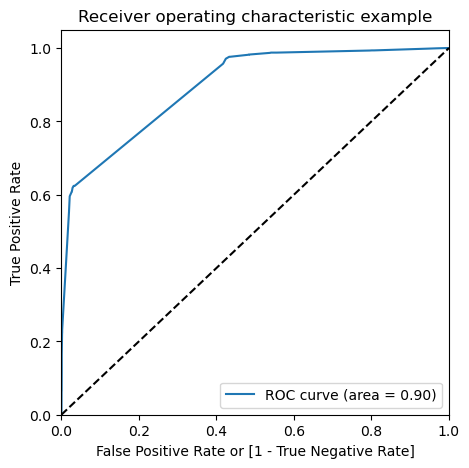

In [104]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.converted_prob)

### Step-10: Finding the optimal cutoff point

In [105]:
# let's create columns with different cuttoff points

numbers = [float(x)/10 for x in range(10)]

for i in numbers:
    y_train_pred_final[i] = y_train_pred_final.converted_prob.map(lambda x : 1 if x>i else 0)

y_train_pred_final.head()

,Converted,converted_prob,Prospect ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.0,0.015408,6487,0,1,0,0,0,0,0,0,0,0,0
1,0.0,0.358775,4759,0,1,1,1,1,0,0,0,0,0,0
2,0.0,0.018804,4368,0,1,0,0,0,0,0,0,0,0,0
3,1.0,0.897375,1467,1,1,1,1,1,1,1,1,1,1,0
4,0.0,0.018804,5517,0,1,0,0,0,0,0,0,0,0,0


In [106]:
# Now lets calculate Accuracy, sensitivity and  Specificity for various cutoff probabalities

cutoff_df = pd.DataFrame(columns = ['prob','Accuracy','sensitivity','specificity'])

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final[i])
    total1=sum(sum(cm1))
    Accuracy = (cm1[0,0]+cm1[1,1])/total1
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    cutoff_df.loc[i] = [i, Accuracy, sensitivity, specificity]
print(cutoff_df)
                         

     prob  Accuracy  sensitivity  specificity
0.0   0.0  0.381494     1.000000     0.000000
0.1   0.1  0.693588     0.981915     0.515748
0.2   0.2  0.723079     0.976241     0.566929
0.3   0.3  0.725649     0.957447     0.582677
0.4   0.4  0.835363     0.624113     0.965661
0.5   0.5  0.836851     0.620922     0.970035
0.6   0.6  0.836580     0.618085     0.971347
0.7   0.7  0.834145     0.609220     0.972878
0.8   0.8  0.834010     0.608865     0.972878
0.9   0.9  0.705357     0.230851     0.998031


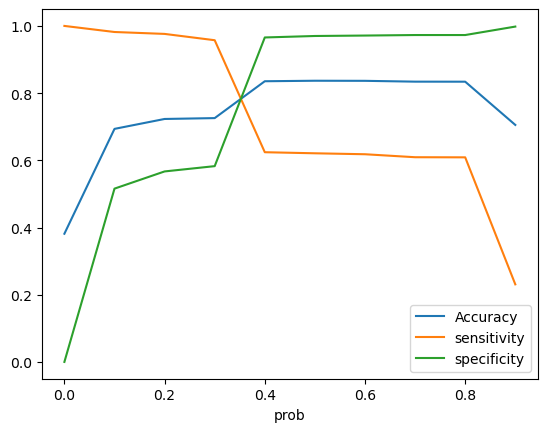

In [107]:
# let's plot the accuracy, specificity, sensitivity 
cutoff_df.plot.line(x='prob',y=['Accuracy','sensitivity','specificity'])
plt.show()

#### From the curve above, 0.4 is the optimum point to take it as a cutoff probability.

In [108]:
y_train_pred_final['final_predicted'] = y_train_pred_final.converted_prob.map( lambda x: 1 if x > 0.4 else 0)

y_train_pred_final.head()

,Converted,converted_prob,Prospect ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0.0,0.015408,6487,0,1,0,0,0,0,0,0,0,0,0,0
1,0.0,0.358775,4759,0,1,1,1,1,0,0,0,0,0,0,0
2,0.0,0.018804,4368,0,1,0,0,0,0,0,0,0,0,0,0
3,1.0,0.897375,1467,1,1,1,1,1,1,1,1,1,1,0,1
4,0.0,0.018804,5517,0,1,0,0,0,0,0,0,0,0,0,0


In [109]:
# Accuracy score
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8353625541125541

In [110]:
# Confusion matrix
confusion_matrix2 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.final_predicted)
confusion_matrix2

array([[4415,  157],
       [1060, 1760]], dtype=int64)

In [111]:
TP = confusion_matrix2[1,1]
FP = confusion_matrix2[0,1]
TN = confusion_matrix2[0,0]
FN = confusion_matrix2[1,0]

In [112]:
# Sensitivity
TP/float(TP+FN)

0.624113475177305

In [113]:
# specificity
TN/float(TN+FP)

0.965660542432196

In [114]:
# False positive rate
FP/float(TN+FP)

0.03433945756780402

In [115]:
# positive predictive rate
TP/float(TP+FP)

0.9181011997913406

In [116]:
# negative predictive value
TN/float(TN+FN)

0.806392694063927

#### Precision and Recall

In [117]:
Precision = TP/float(FP+TP)
Precision

0.9181011997913406

In [118]:
Recall = TP/float(TP+FN)
Recall

0.624113475177305

In [119]:
# Using sklearn utilities for the same
from sklearn.metrics import precision_score, recall_score, precision_recall_curve

precision = precision_score(y_train_pred_final.Converted,y_train_pred_final.final_predicted)
precision

0.9181011997913406

In [120]:
Recall = recall_score(y_train_pred_final.Converted,y_train_pred_final.final_predicted)
Recall

0.624113475177305

#### Precision and recall tradeoff

In [121]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.converted_prob)

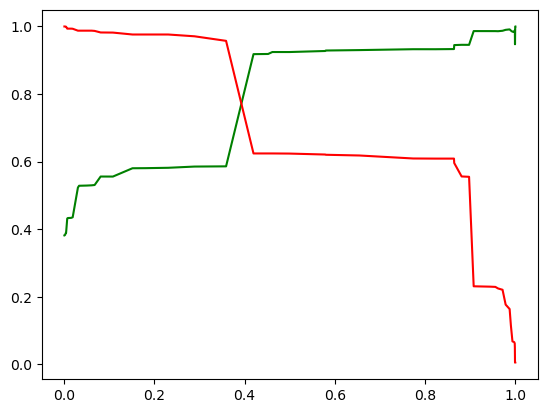

In [122]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Step - 11: Making predictions on the test data (Model Evaluation)

In [123]:
# Scaling the continous variables in the test dataset
x_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']]= scaler.transform(x_test[['TotalVisits',
                                                                                                             'Total Time Spent on Website',
                                                                                                             'Page Views Per Visit']])

In [124]:
x_test = x_test[col]
x_test.head()

,Do Not Email,Lead Origin_Lead Add Form,Lead Source_Welingak Website,Tags_Busy,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_SMS Sent,Last Notable Activity_Unsubscribed
4608,0,0,0,0,1,0,0,0,0,0,0,0
7935,1,0,0,0,0,0,0,1,0,0,0,0
4043,1,0,0,0,0,0,0,1,0,0,0,0
7821,0,0,0,0,0,0,1,0,0,0,0,0
856,0,0,0,0,0,0,0,1,0,0,0,0


In [125]:
# Add constant to the x_test variables
x_test_sm = sm.add_constant(x_test)
x_test_sm.shape

(1848, 13)

In [126]:
# Making predictions on test data
y_test_pred = res.predict(x_test_sm)
y_test_pred

4608    0.987269
7935    0.107967
4043    0.107967
7821    0.004608
856     0.358775
          ...   
7387    0.358775
3063    0.971569
603     0.004608
4210    0.358775
7352    0.004608
Length: 1848, dtype: float64

In [127]:
# Creating a dataframe "y_pred_1"
y_pred_1 = pd.DataFrame(y_test_pred)

In [128]:
# creating a dataframe "y_test_df"
y_test_df = pd.DataFrame(y_test)

In [129]:
# adding prospect id column
y_test_df['Prospect_ID'] = y_test_df.index

In [130]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [131]:
# Appending y_test_df and y_pred_1 datafromes 
y_pred_final = pd.concat([y_test_df,y_pred_1],axis=1)
y_pred_final.head()

,Converted,Prospect_ID,0
0,1.0,4608,0.987269
1,0.0,7935,0.107967
2,0.0,4043,0.107967
3,0.0,7821,0.004608
4,0.0,856,0.358775


In [132]:
# Renaming the column
y_pred_final = y_pred_final.rename(columns = {0: 'Converted_prob'})
y_pred_final

,Converted,Prospect_ID,Converted_prob
0,1.0,4608,0.987269
1,0.0,7935,0.107967
2,0.0,4043,0.107967
3,0.0,7821,0.004608
4,0.0,856,0.358775
...,...,...,...
1843,1.0,7387,0.358775
1844,1.0,3063,0.971569
1845,0.0,603,0.004608
1846,1.0,4210,0.358775


In [133]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Prospect_ID','Converted','Converted_prob'],axis=1)
y_pred_final.head()

,Prospect_ID,Converted,Converted_prob
0,4608,1.0,0.987269
1,7935,0.0,0.107967
2,4043,0.0,0.107967
3,7821,0.0,0.004608
4,856,0.0,0.358775


In [134]:
# Mapping the converted prob to 0 or 1
y_pred_final['final_predicted'] = y_pred_final.Converted_prob.map(lambda x: 1 if x>0.38 else 0)

In [135]:
y_pred_final.head()

,Prospect_ID,Converted,Converted_prob,final_predicted
0,4608,1.0,0.987269,1
1,7935,0.0,0.107967,0
2,4043,0.0,0.107967,0
3,7821,0.0,0.004608,0
4,856,0.0,0.358775,0


In [136]:
# calculating the lead scores (0-100)
y_pred_final['Lead score'] = (y_pred_final['Converted_prob']*100).round(0).astype(int)
y_pred_final

,Prospect_ID,Converted,Converted_prob,final_predicted,Lead score
0,4608,1.0,0.987269,1,99
1,7935,0.0,0.107967,0,11
2,4043,0.0,0.107967,0,11
3,7821,0.0,0.004608,0,0
4,856,0.0,0.358775,0,36
...,...,...,...,...,...
1843,7387,1.0,0.358775,0,36
1844,3063,1.0,0.971569,1,97
1845,603,0.0,0.004608,0,0
1846,4210,1.0,0.358775,0,36


In [137]:
# Accuracy
metrics.accuracy_score(y_pred_final.Converted,y_pred_final.final_predicted)

0.8284632034632035

In [138]:
confusion3 = metrics.confusion_matrix(y_pred_final.Converted,y_pred_final.final_predicted)
confusion3

array([[1061,   46],
       [ 271,  470]], dtype=int64)

In [139]:
TP = confusion3[1,1] # true positive 
TN = confusion3[0,0] # true negatives
FP = confusion3[0,1] # false positives
FN = confusion3[1,0] # false negatives

In [140]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.6342780026990553

In [141]:
# Let us calculate specificity
TN / float(TN+FP)

0.9584462511291779

In [142]:
# Precision
Precision = TP/float(FP+TP)
Precision

0.9108527131782945

In [143]:
# Recall
Recall = TP/float(TP+FN)
Recall

0.6342780026990553

### Generating lead scores (0-100)

In [144]:
# Tagging the users as "very hot leads",'warm leads", "cold leads" based on their lead score
y_pred_final['Interpretation'] = y_pred_final['Lead score'].map(lambda x: 'Very Hot Leads' if x>80 else 'Warm leads' if (50<x<79) else 'Cold Leads' )
y_pred_final

,Prospect_ID,Converted,Converted_prob,final_predicted,Lead score,Interpretation
0,4608,1.0,0.987269,1,99,Very Hot Leads
1,7935,0.0,0.107967,0,11,Cold Leads
2,4043,0.0,0.107967,0,11,Cold Leads
3,7821,0.0,0.004608,0,0,Cold Leads
4,856,0.0,0.358775,0,36,Cold Leads
...,...,...,...,...,...,...
1843,7387,1.0,0.358775,0,36,Cold Leads
1844,3063,1.0,0.971569,1,97,Very Hot Leads
1845,603,0.0,0.004608,0,0,Cold Leads
1846,4210,1.0,0.358775,0,36,Cold Leads


# Answering Business Questions

- 1. Which are the top three variables in your model which contribute most towards the
probability of a lead getting converted?


- 2. What are the top 3 categorical/dummy variables in the model which should be focused
the most on to increase the probability of lead conversion?

- 3. X Education has a period of 2 months every year during which they hire some interns.
The sales team has around 10 interns allotted to them. So, during this phase, they wish
to make the lead conversion more aggressive. So, they want almost all the potential
leads (i.e., the customers who have been predicted as 1 by the model) to be converted
and hence, want to make phone calls to as much of such people as possible. Suggest a
good strategy they should employ at this stage.

- 4. Similarly, at times, the company reaches its target for a quarter before the deadline.
During this time, the company wants the sales team to focus on some new work as well.
So, during this time, the company’s aim is to not make phone calls unless it’s extremely
necessary, i.e., they want to minimize the rate of useless phone calls. Suggest a
strategy they should employ at this stage.


#### Question -1:

In [145]:
import pandas as pd
import numpy as np

# get feature names + coefficients directly from statsmodels
coef_df = pd.DataFrame({
    'Feature': res.params.index,
    'Coefficient': res.params.values
})
coef_df = coef_df[coef_df['Feature'] != 'const']
# add absolute coefficient for ranking
coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])

# sort by absolute coefficient
coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False)

# top 3 variables
top_3 = coef_df.head(3)
print(top_3)


                                           Feature  Coefficient  \
5                          Tags_Closed by Horizzon     8.305587   
6                                Tags_Lost to EINS     7.486129   
10  Last Notable Activity_Had a Phone Conversation     3.799912   

    Abs_Coefficient  
5          8.305587  
6          7.486129  
10         3.799912  


#### Question -2:

In [146]:

# Assuming 'res' is your fitted statsmodels Logit/GLM model
coefficients = res.params  

# Put into dataframe
coef_df = pd.DataFrame({
    'Feature': coefficients.index,
    'Coefficient': coefficients.values,
    'Abs_Coefficient': np.abs(coefficients.values)
})

# Keep only categorical (dummy) variables
dummy_vars = [col for col in coef_df['Feature'] if "_" in col]  # dummies usually have "_" in names
coef_df = coef_df[coef_df['Feature'].isin(dummy_vars)]

# Sort by absolute coefficient
coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False)

# Get top 3
top3 = coef_df.head(3)
print(top3)


                                           Feature  Coefficient  \
5                          Tags_Closed by Horizzon     8.305587   
6                                Tags_Lost to EINS     7.486129   
10  Last Notable Activity_Had a Phone Conversation     3.799912   

    Abs_Coefficient  
5          8.305587  
6          7.486129  
10         3.799912  


#### Question -3:

Here, the goal of X Education during the 2-month intern period is very different from the normal business-as-usual mode:

- Normal case: Sales team has limited capacity → need high precision (focus only on best, “hottest” leads).

- Intern phase: More manpower (10 interns) → can afford to reach out to more leads → need high recall (don’t miss out on potential leads, even if some extra non-converters slip in).

#### By reducing the Decision Cutoff (Threshold) we can achieve this

In [147]:
# Reducing decision cuttoff to 0.3
y_train_pred_final['final_predicted'] = y_train_pred_final.converted_prob.map( lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,Converted,converted_prob,Prospect ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0.0,0.015408,6487,0,1,0,0,0,0,0,0,0,0,0,0
1,0.0,0.358775,4759,0,1,1,1,1,0,0,0,0,0,0,1
2,0.0,0.018804,4368,0,1,0,0,0,0,0,0,0,0,0,0
3,1.0,0.897375,1467,1,1,1,1,1,1,1,1,1,1,0,1
4,0.0,0.018804,5517,0,1,0,0,0,0,0,0,0,0,0,0


In [148]:
# Accuracy score
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.7256493506493507

In [149]:
# confusion Matrix 
confusion_matrix2 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.final_predicted)


In [150]:
TP = confusion_matrix2[1,1] # True positive
FP = confusion_matrix2[0,1] # False positive
TN = confusion_matrix2[0,0] # True negative
FN = confusion_matrix2[1,0] # False negative

Precision

In [151]:
Precision = TP/float(FP+TP)
Precision

0.5859375

Recall

In [152]:
Recall = TP/float(TP+FN)
Recall

0.9574468085106383

#### Question-4:

When the quarterly sales target is already met, the company should raise the cutoff probability (e.g., to 0.6–0.7) and focus only on the highest scoring leads (e.g., score 80–100). This will maximize precision and minimize wasted phone calls, while still ensuring that the very best opportunities are pursued.

In [153]:
# Increasing decision cuttoff to 0.3
y_train_pred_final['final_predicted'] = y_train_pred_final.converted_prob.map( lambda x: 1 if x > 0.7 else 0)

y_train_pred_final.head()

,Converted,converted_prob,Prospect ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0.0,0.015408,6487,0,1,0,0,0,0,0,0,0,0,0,0
1,0.0,0.358775,4759,0,1,1,1,1,0,0,0,0,0,0,0
2,0.0,0.018804,4368,0,1,0,0,0,0,0,0,0,0,0,0
3,1.0,0.897375,1467,1,1,1,1,1,1,1,1,1,1,0,1
4,0.0,0.018804,5517,0,1,0,0,0,0,0,0,0,0,0,0


In [154]:
# Accuracy score
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8341450216450217

In [155]:
# confusion Matrix 
confusion_matrix3 = metrics.confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.final_predicted)

In [156]:
TP = confusion_matrix3[1,1] # True positive
FP = confusion_matrix3[0,1] # False positive
TN = confusion_matrix3[0,0] # True negative
FN = confusion_matrix3[1,0] # False negative

Precision

In [157]:
Precision = TP/float(FP+TP)
Precision

0.9326818675352877

Recall

In [158]:
Recall = TP/float(TP+FN)
Recall

0.6092198581560284